## LL3 (abs logFC based) 125D3

In [1]:
library (tidyverse)
library (openxlsx)
library (magrittr)
library (ggrepel)
library (cowplot)
library (reshape2)
library (readr)
library (ggpubr)
library (drc)
library (broom)
library (modelr)
library (purrr)

── Attaching packages ─────────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ dplyr   1.0.7
✔ tidyr   1.1.4     ✔ stringr 1.4.0
✔ readr   2.1.1     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘magrittr’


The following object is masked from ‘package:purrr’:

    set_names


The following object is masked from ‘package:tidyr’:

    extract



Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths



Attaching package: ‘ggpubr’


The following object is masked from ‘package:cowplot’:

    get_legend


Loading required package: MASS


Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select



'drc' has been loaded.


Please cite R and 'drc' if used for a publica

In [2]:
fig <- function(width, heigth){
options(repr.plot.width = width, repr.plot.height = heigth)}

In [3]:
long = read.table("./data/f_CA2021_inlog_FC15_FC2_evidence-threshold_final.tsv", sep = '\t', row.names =1, header = T)

In [4]:
d = long %>%
filter (., ref_206  == "yes")
dim (d)

[1] 206 150

In [5]:
str(d, list.len=ncol(d))

'data.frame':	206 obs. of  150 variables:
 $ EtOH_x_04h_R1          : num  3.863 11.708 0.169 3.332 5.89 ...
 $ EtOH_x_04h_R2          : num  3.447 11.653 0.189 3.894 5.829 ...
 $ EtOH_x_04h_R3          : num  3.794 11.724 -0.191 3.652 5.732 ...
 $ EtOH_x_08h_R1          : num  5.17 11.82 1.74 3.02 5.5 ...
 $ EtOH_x_08h_R2          : num  5.32 11.81 2.3 2.92 5.33 ...
 $ EtOH_x_08h_R3          : num  5.72 11.78 1.96 2.84 4.83 ...
 $ EtOH_x_24h_R1          : num  6.77 12.9 2.26 4.96 5.56 ...
 $ EtOH_x_24h_R2          : num  6.61 12.62 3.04 4.42 5.26 ...
 $ EtOH_x_24h_R3          : num  7.19 12.47 2.74 4.6 4.38 ...
 $ V125D3_0.1nM_24h_R1    : num  6.29 12.37 2.72 4.58 4.8 ...
 $ V125D3_0.1nM_24h_R2    : num  6.57 12.11 3.02 4.38 4.53 ...
 $ V125D3_0.1nM_24h_R3    : num  6.48 12.31 3.2 4.38 4.59 ...
 $ V125D3_10nM_04h_R1     : num  3.166 11.387 0.208 3.374 5.127 ...
 $ V125D3_10nM_04h_R2     : num  3.255 11.405 0.879 3.691 5.543 ...
 $ V125D3_10nM_04h_R3     : num  3.387 11.52 -0.191 3.326

In [6]:
d$abs_logFC_V125D3_0.1nM_24h = abs(d$logFC_V125D3_0.1nM_24h)
d$abs_logFC_V125D3_1nM_24h = abs(d$logFC_V125D3_1nM_24h)
d$abs_logFC_V125D3_10nM_24h = abs(d$logFC_V125D3_10nM_24h)

In [7]:
davg = d %>%
dplyr::select (., abs_logFC_V125D3_0.1nM_24h:abs_logFC_V125D3_10nM_24h)

In [8]:
davg = davg %>%
  mutate (abs_logFC_V125D3_0_24h = rep(0,nrow(.)))

In [9]:
head (davg)

,abs_logFC_V125D3_0.1nM_24h,abs_logFC_V125D3_1nM_24h,abs_logFC_V125D3_10nM_24h,abs_logFC_V125D3_0_24h
,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,0.4393014,0.4772106,1.433093,0
ACTB,0.4093385,0.8379242,1.312556,0
ACVRL1,0.3542608,2.0012889,1.835546,0
ADAMTSL4,0.2488015,0.8881514,2.255927,0
ADGRE1,0.5175299,2.4298480,2.444798,0
ADGRE3,0.3603708,3.5436203,2.815850,0


In [10]:
dt = davg

In [11]:
newfishes = rownames (dt)
head(newfishes)

[1] "ABCC3"    "ACTB"     "ACVRL1"   "ADAMTSL4" "ADGRE1"   "ADGRE3"

In [12]:
df2_Ind = as.vector (colnames (dt))

df_y = colsplit(df2_Ind, "_", c("placeholder","placeholder2","treatment", "concentration", "time"))
df_y = as.data.frame(unclass(df_y))
df_y$sample <- df2_Ind

df_y = df_y %>%
  mutate(., conc = concentration)

df_y$conc <- gsub("nM","",as.character(df_y$conc))
df_y$conc = as.numeric (df_y$conc)

df_y

placeholder,placeholder2,treatment,concentration,time,sample,conc
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
abs,logFC,V125D3,0.1nM,24h,abs_logFC_V125D3_0.1nM_24h,0.1
abs,logFC,V125D3,1nM,24h,abs_logFC_V125D3_1nM_24h,1.0
abs,logFC,V125D3,10nM,24h,abs_logFC_V125D3_10nM_24h,10.0
abs,logFC,V125D3,0,24h,abs_logFC_V125D3_0_24h,0.0


In [13]:
small_pwt_T = as.data.frame (t(dt))
small_pwt_T

small_pwt_T = small_pwt_T %>%
  rownames_to_column ("sample")

mrg = merge(x=small_pwt_T,y=df_y,by.x="sample", all.x =T)
(head)

head(mrg)

,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,AQP9,⋯,TMEM176A,TMEM176B,TNFRSF21,TNFRSF4,TREM1,TRIM36,TRPM2,TXLNB,VSIG4,ZBTB46
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
abs_logFC_V125D3_0.1nM_24h,0.4393014,0.4093385,0.3542608,0.2488015,0.5175299,0.3603708,0.7969338,0.9906315,0.3521981,0.5962199,⋯,0.7368871,0.5691636,0.3732527,1.342611,1.105965,0.5354586,0.4065823,0.331141,0.2507109,0.7686911
abs_logFC_V125D3_1nM_24h,0.4772106,0.8379242,2.0012889,0.8881514,2.4298480,3.5436203,2.0552747,1.4340208,1.2565690,1.8237742,⋯,1.7077691,1.5700009,1.7967302,1.769133,2.717710,2.4000254,1.5905005,2.361485,1.4989159,2.4213406
abs_logFC_V125D3_10nM_24h,1.4330934,1.3125561,1.8355459,2.2559273,2.4447976,2.8158500,2.3412441,2.1395893,1.6207382,2.1804793,⋯,3.5310448,2.9686203,2.5772534,2.142502,2.976961,3.0942845,3.0259551,3.485474,1.9013768,3.3375038
abs_logFC_V125D3_0_24h,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,⋯,0.0000000,0.0000000,0.0000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000


function (x, ...) 
UseMethod("head")
<bytecode: 0x556913c64420>
<environment: namespace:utils>

,sample,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,⋯,TRPM2,TXLNB,VSIG4,ZBTB46,placeholder,placeholder2,treatment,concentration,time,conc
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,abs_logFC_V125D3_0_24h,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,⋯,0.0000000,0.000000,0.0000000,0.0000000,abs,logFC,V125D3,0,24h,0.0
2,abs_logFC_V125D3_0.1nM_24h,0.4393014,0.4093385,0.3542608,0.2488015,0.5175299,0.3603708,0.7969338,0.9906315,0.3521981,⋯,0.4065823,0.331141,0.2507109,0.7686911,abs,logFC,V125D3,0.1nM,24h,0.1
3,abs_logFC_V125D3_10nM_24h,1.4330934,1.3125561,1.8355459,2.2559273,2.4447976,2.8158500,2.3412441,2.1395893,1.6207382,⋯,3.0259551,3.485474,1.9013768,3.3375038,abs,logFC,V125D3,10nM,24h,10.0
4,abs_logFC_V125D3_1nM_24h,0.4772106,0.8379242,2.0012889,0.8881514,2.4298480,3.5436203,2.0552747,1.4340208,1.2565690,⋯,1.5905005,2.361485,1.4989159,2.4213406,abs,logFC,V125D3,1nM,24h,1.0


In [14]:
roworder <- c("abs_logFC_V125D3_0_24h", "abs_logFC_V125D3_0.1nM_24h", 
              "abs_logFC_V125D3_1nM_24h", "abs_logFC_V125D3_10nM_24h")
mrg = mrg %>%
  slice(match(roworder, sample))

In [15]:
head (mrg)

,sample,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,⋯,TRPM2,TXLNB,VSIG4,ZBTB46,placeholder,placeholder2,treatment,concentration,time,conc
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,abs_logFC_V125D3_0_24h,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,⋯,0.0000000,0.000000,0.0000000,0.0000000,abs,logFC,V125D3,0,24h,0.0
2,abs_logFC_V125D3_0.1nM_24h,0.4393014,0.4093385,0.3542608,0.2488015,0.5175299,0.3603708,0.7969338,0.9906315,0.3521981,⋯,0.4065823,0.331141,0.2507109,0.7686911,abs,logFC,V125D3,0.1nM,24h,0.1
3,abs_logFC_V125D3_1nM_24h,0.4772106,0.8379242,2.0012889,0.8881514,2.4298480,3.5436203,2.0552747,1.4340208,1.2565690,⋯,1.5905005,2.361485,1.4989159,2.4213406,abs,logFC,V125D3,1nM,24h,1.0
4,abs_logFC_V125D3_10nM_24h,1.4330934,1.3125561,1.8355459,2.2559273,2.4447976,2.8158500,2.3412441,2.1395893,1.6207382,⋯,3.0259551,3.485474,1.9013768,3.3375038,abs,logFC,V125D3,10nM,24h,10.0


In [16]:
mrg2 = mrg %>% 
  pivot_longer(all_of(newfishes)) %>% 
  arrange (name)

mrg2$name <- as.factor(mrg2$name)
head (mrg2)

mrg2 = mrg2 %>%
  dplyr::group_by(name)
head (mrg2)

sample,placeholder,placeholder2,treatment,concentration,time,conc,name,value
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<dbl>
abs_logFC_V125D3_0_24h,abs,logFC,V125D3,0,24h,0.0,ABCC3,0.0000000
abs_logFC_V125D3_0.1nM_24h,abs,logFC,V125D3,0.1nM,24h,0.1,ABCC3,0.4393014
abs_logFC_V125D3_1nM_24h,abs,logFC,V125D3,1nM,24h,1.0,ABCC3,0.4772106
abs_logFC_V125D3_10nM_24h,abs,logFC,V125D3,10nM,24h,10.0,ABCC3,1.4330934
abs_logFC_V125D3_0_24h,abs,logFC,V125D3,0,24h,0.0,ACTB,0.0000000
abs_logFC_V125D3_0.1nM_24h,abs,logFC,V125D3,0.1nM,24h,0.1,ACTB,0.4093385


sample,placeholder,placeholder2,treatment,concentration,time,conc,name,value
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<dbl>
abs_logFC_V125D3_0_24h,abs,logFC,V125D3,0,24h,0.0,ABCC3,0.0000000
abs_logFC_V125D3_0.1nM_24h,abs,logFC,V125D3,0.1nM,24h,0.1,ABCC3,0.4393014
abs_logFC_V125D3_1nM_24h,abs,logFC,V125D3,1nM,24h,1.0,ABCC3,0.4772106
abs_logFC_V125D3_10nM_24h,abs,logFC,V125D3,10nM,24h,10.0,ABCC3,1.4330934
abs_logFC_V125D3_0_24h,abs,logFC,V125D3,0,24h,0.0,ACTB,0.0000000
abs_logFC_V125D3_0.1nM_24h,abs,logFC,V125D3,0.1nM,24h,0.1,ACTB,0.4093385


In [17]:
mrg3= mrg2 %>%
dplyr::select (., c("conc", "name", "value")) 

head(mrg3)

conc,name,value
<dbl>,<fct>,<dbl>
0.0,ABCC3,0.0000000
0.1,ABCC3,0.4393014
1.0,ABCC3,0.4772106
10.0,ABCC3,1.4330934
0.0,ACTB,0.0000000
0.1,ACTB,0.4093385


ec_50:(Intercept) 
        0.4846366

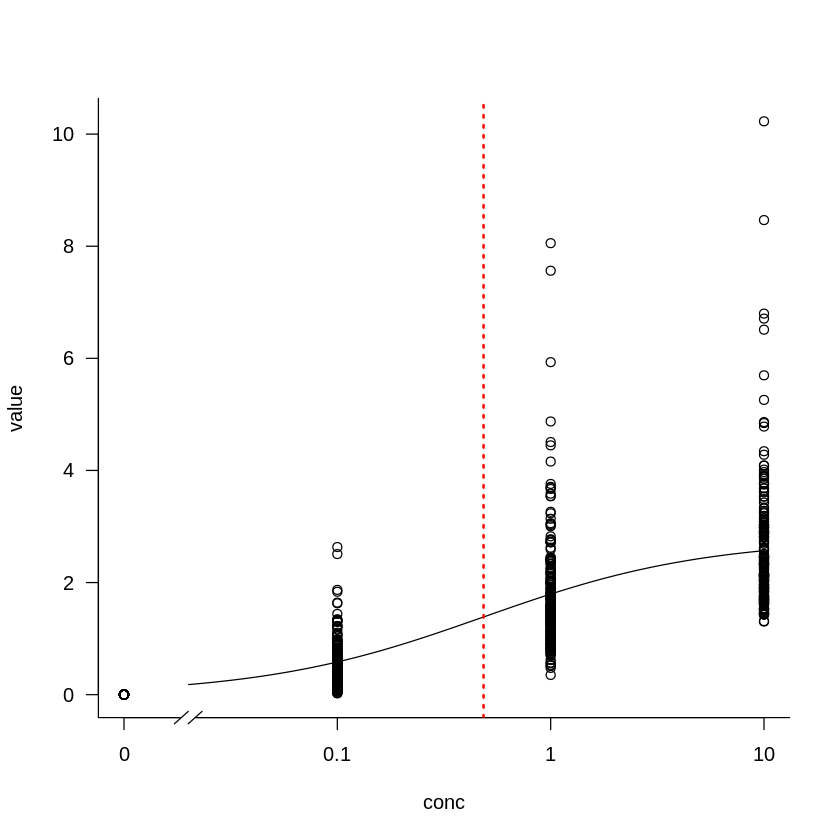

In [18]:
hydroxytestLL.3 <- drm(value ~ conc,
                   data = mrg2,
  fct = LL.3(
      names = c('hill', 'max_value', 'ec_50')))

ec50 <- hydroxytestLL.3$coefficients['ec_50:(Intercept)']
ec50

plot(hydroxytestLL.3, bty="l", type = "all", broken=TRUE)#log = ""
abline(v = ec50, col="red", lwd=2, lty=3)

In [19]:
summary (hydroxytestLL.3)


Model fitted: Log-logistic (ED50 as parameter) with lower limit at 0 (3 parms)

Parameter estimates:

                       Estimate Std. Error  t-value   p-value    
hill:(Intercept)      -0.837359   0.077974 -10.7390 < 2.2e-16 ***
max_value:(Intercept)  2.772268   0.100966  27.4574 < 2.2e-16 ***
ec_50:(Intercept)      0.484637   0.066944   7.2394 1.037e-12 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error:

 0.8140878 (821 degrees of freedom)

In [20]:
round (0.484637,2)
round (0.066944,2)

[1] 0.48

[1] 0.07

In [21]:
ED (hydroxytestLL.3, respLev = c(50), type = "relative") 


Estimated effective doses

       Estimate Std. Error
e:1:50 0.484637   0.066944


In [22]:
#test

test_LL.3 = drm(value ~ conc, 
    data = mrg3, 
    fct= LL.3(names = c('hill', 'max_value', 'ec_50')))

In [23]:
head (test_LL.3)

450.36773,-274.2753,46.78496
-274.27528,544.5028,-489.42862
46.78496,-489.4286,863.48533


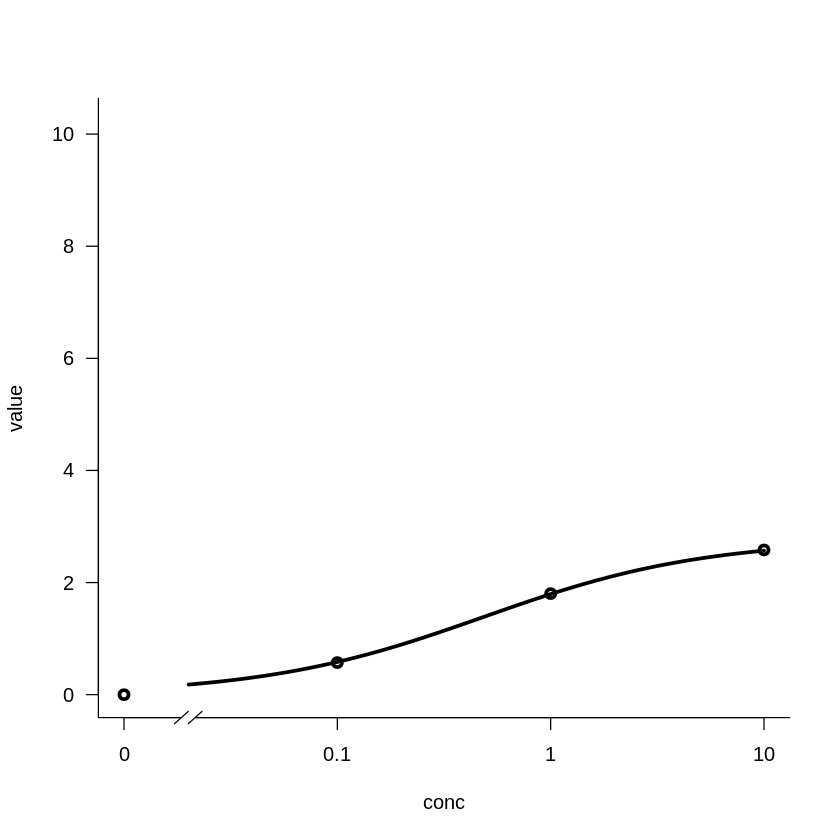

In [24]:
plot (test_LL.3,
            bty="l",  
       broken=TRUE, 
       lwd=3)

In [25]:
mrg4= mrg3 %>%
#dplyr::select (., c("conc", "name", "value")) %>% 
summarise(real_maxval = max(value))

In [26]:
d = mrg3  %>% 
nest(-name)

head(d)

Warning message:
“All elements of `...` must be named.
Did you want `data = c(conc, value)`?”


name,data
<fct>,<list>
ABCC3,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.4393014, 0.4772106, 1.4330934"
ACTB,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.4093385, 0.8379242, 1.3125561"
ACVRL1,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.3542608, 2.0012889, 1.8355459"
ADAMTSL4,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.2488015, 0.8881514, 2.2559273"
ADGRE1,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.5175299, 2.4298480, 2.4447976"
ADGRE3,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.3603708, 3.5436203, 2.8158500"


In [27]:
d = d %>%
mutate (real_maxval = map_dbl(data, ~{max(.x$value)}))
#tidy

head (d)

name,data,real_maxval
<fct>,<list>,<dbl>
ABCC3,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.4393014, 0.4772106, 1.4330934",1.433093
ACTB,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.4093385, 0.8379242, 1.3125561",1.312556
ACVRL1,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.3542608, 2.0012889, 1.8355459",2.001289
ADAMTSL4,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.2488015, 0.8881514, 2.2559273",2.255927
ADGRE1,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.5175299, 2.4298480, 2.4447976",2.444798
ADGRE3,"0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.3603708, 3.5436203, 2.8158500",3.543620


In [28]:
d$data[d$name == "ABCC3"]

conc,value
<dbl>,<dbl>
0.0,0.0000000
0.1,0.4393014
1.0,0.4772106
10.0,1.4330934


In [29]:
gene_model_LL.3 <- function(df){
drm(value ~ conc, 
    data = df, 
    fct= LL.3(names = c('hill', 'max_value', 'ec_50')))
}

In [30]:
#Fitting models to nested data

d = d %>%
mutate (fit = map(data, gene_model_LL.3))

head (d, n =2)

name 
1 ABCC3
2 ACTB 
  data                                                                                   
1 0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.4393014, 0.4772106, 1.4330934
2 0.0000000, 0.1000000, 1.0000000, 10.0000000, 0.0000000, 0.4093385, 0.8379242, 1.3125561
  real_maxval
1 1.433093   
2 1.312556   
  fit                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [31]:
d$fit[d$name == "ABCC3"]

[[1]]

A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
              -0.4268                 5.1576               101.4303  



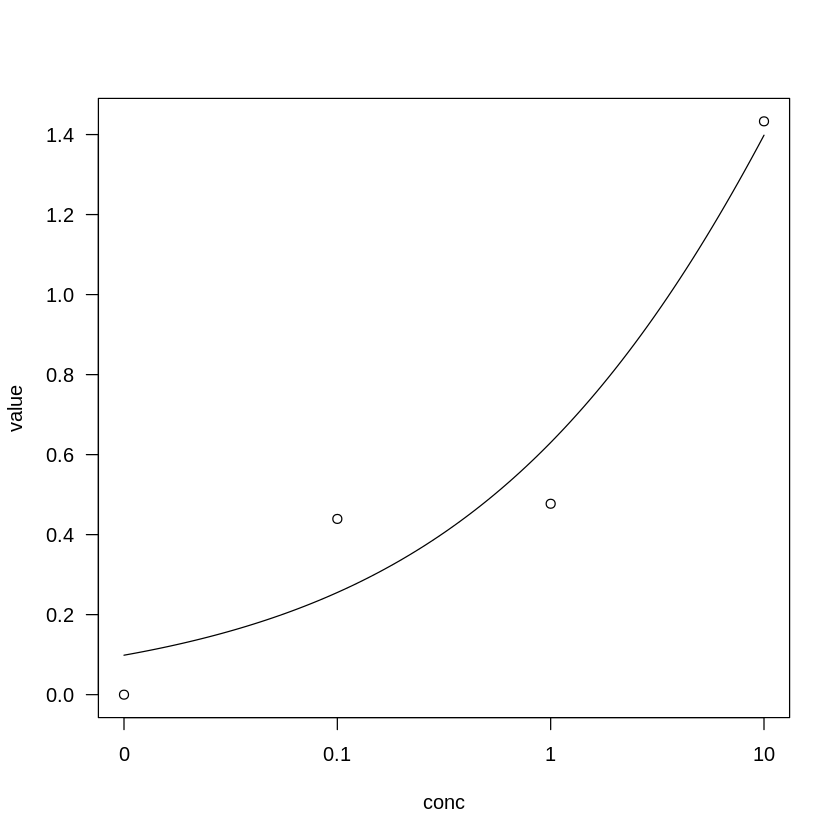

In [32]:
plot(d$fit[[1]])


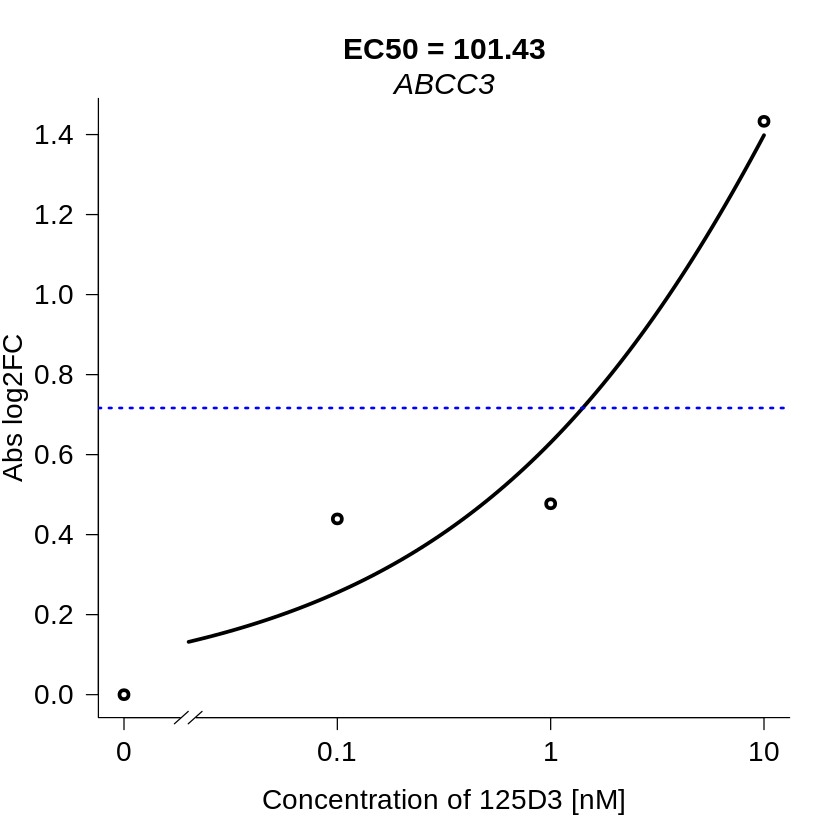

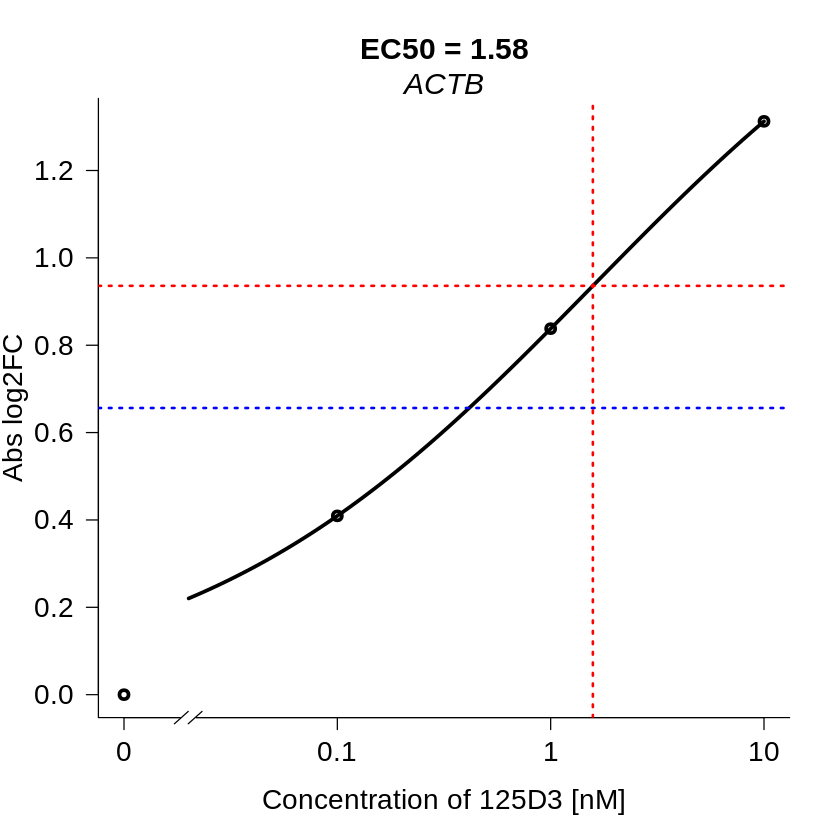

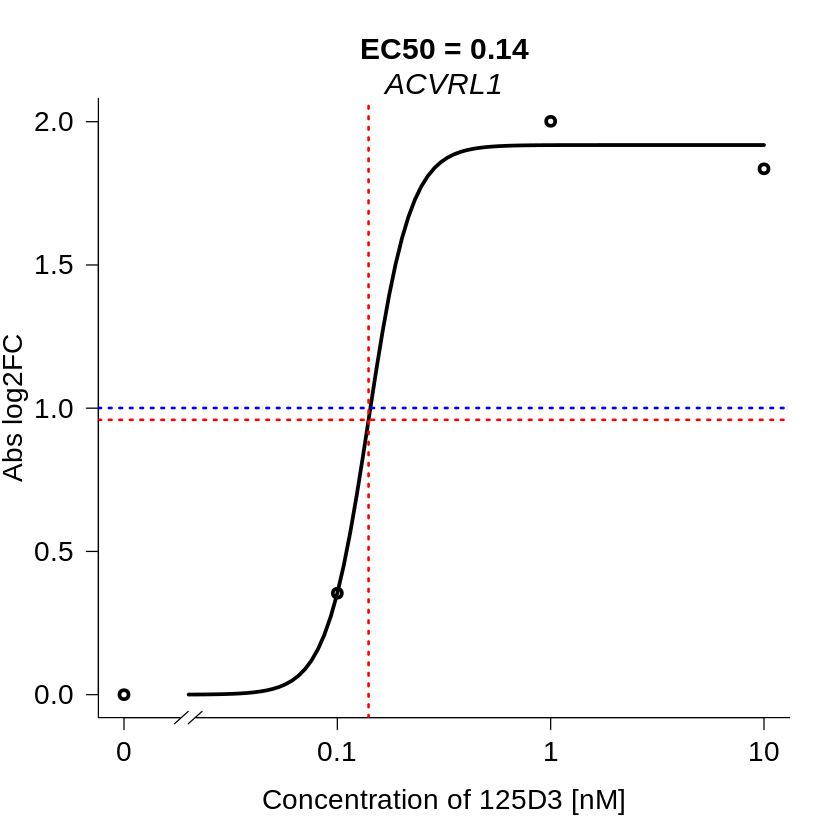

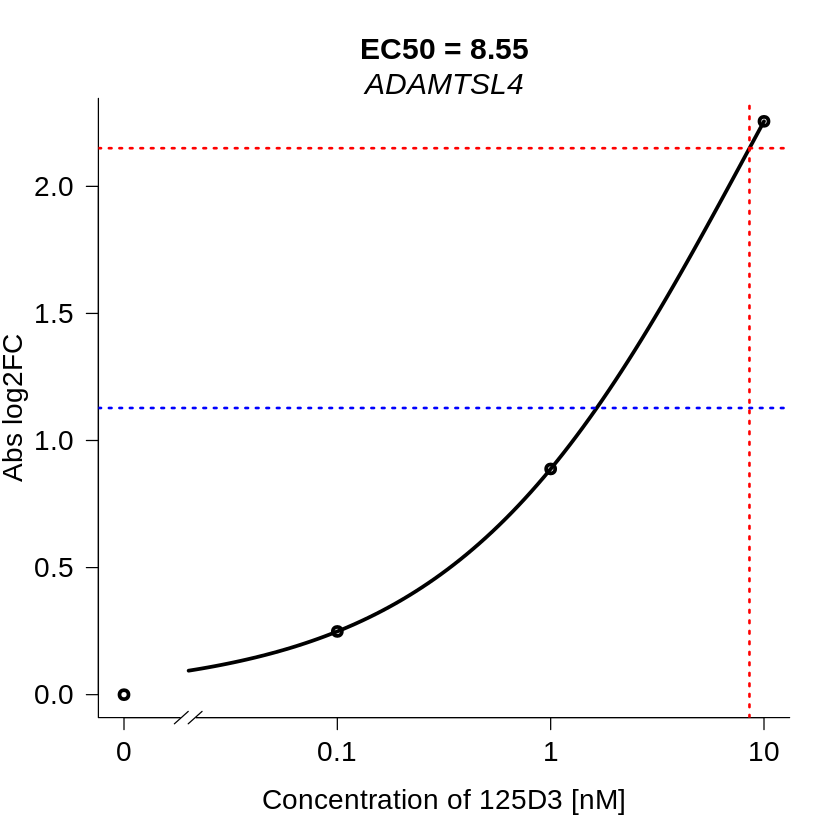

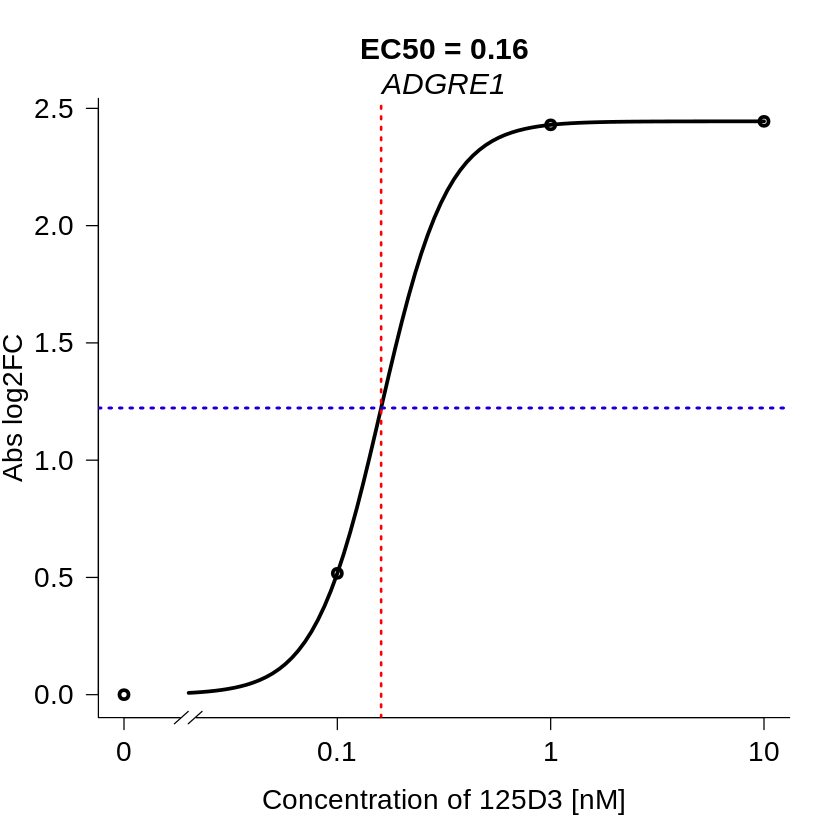

...

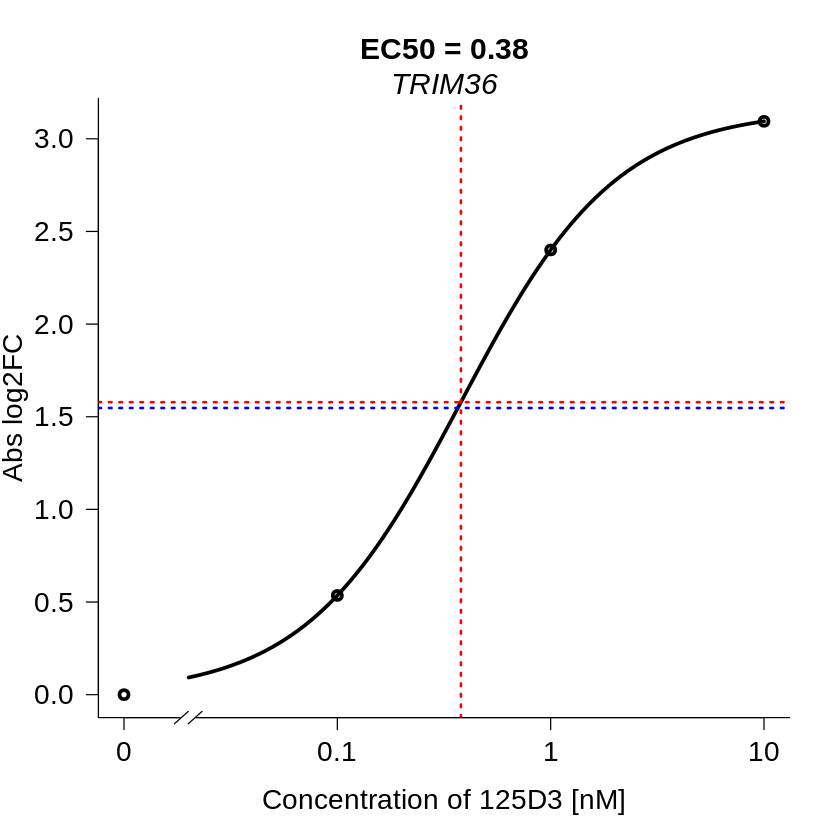

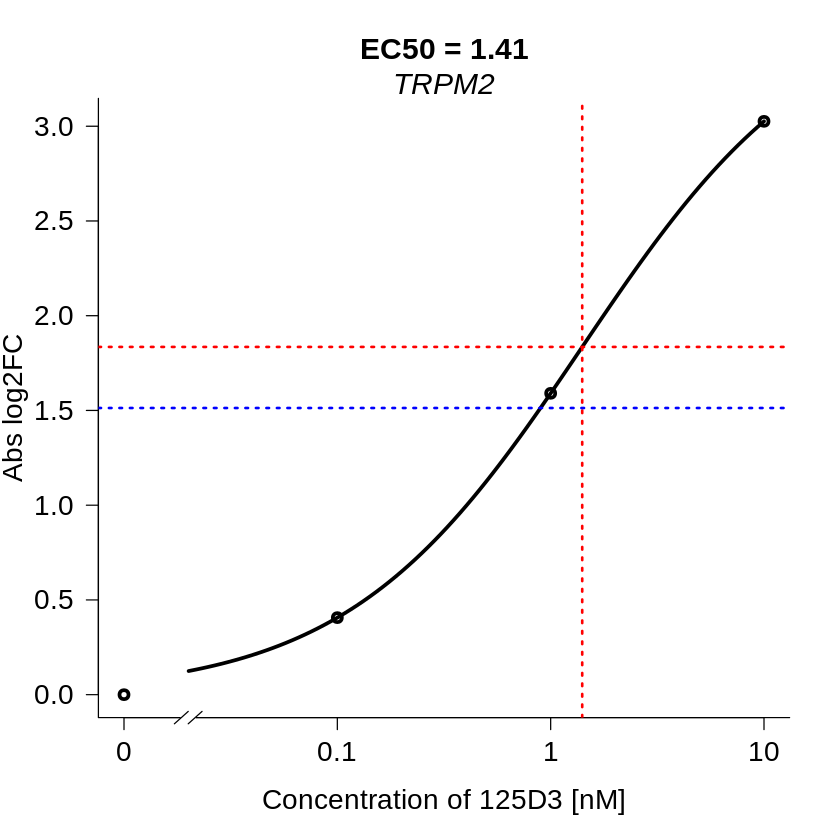

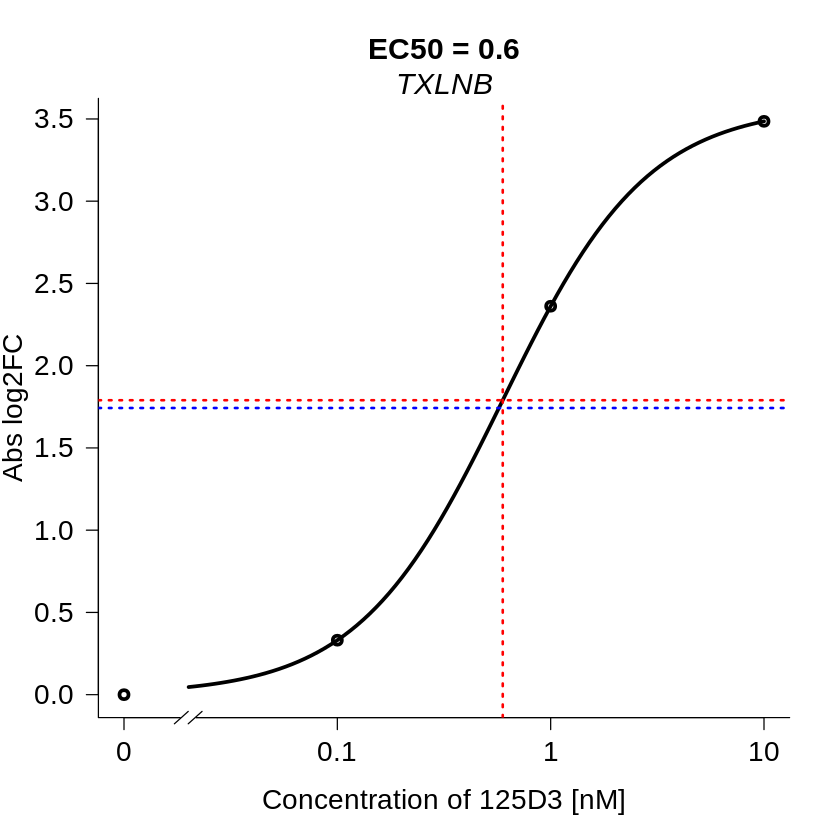

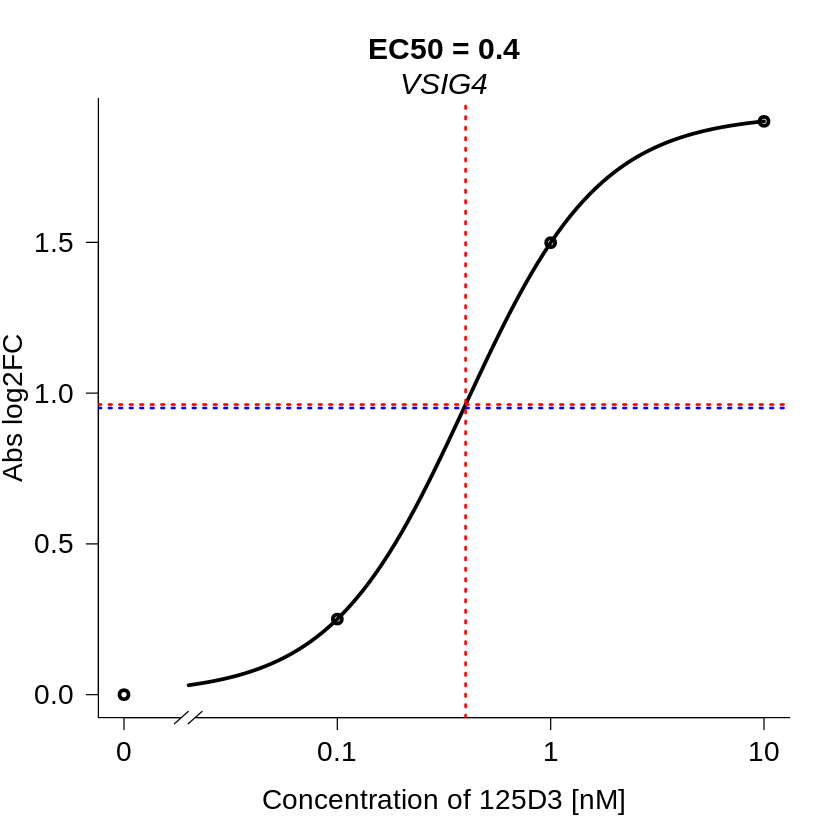

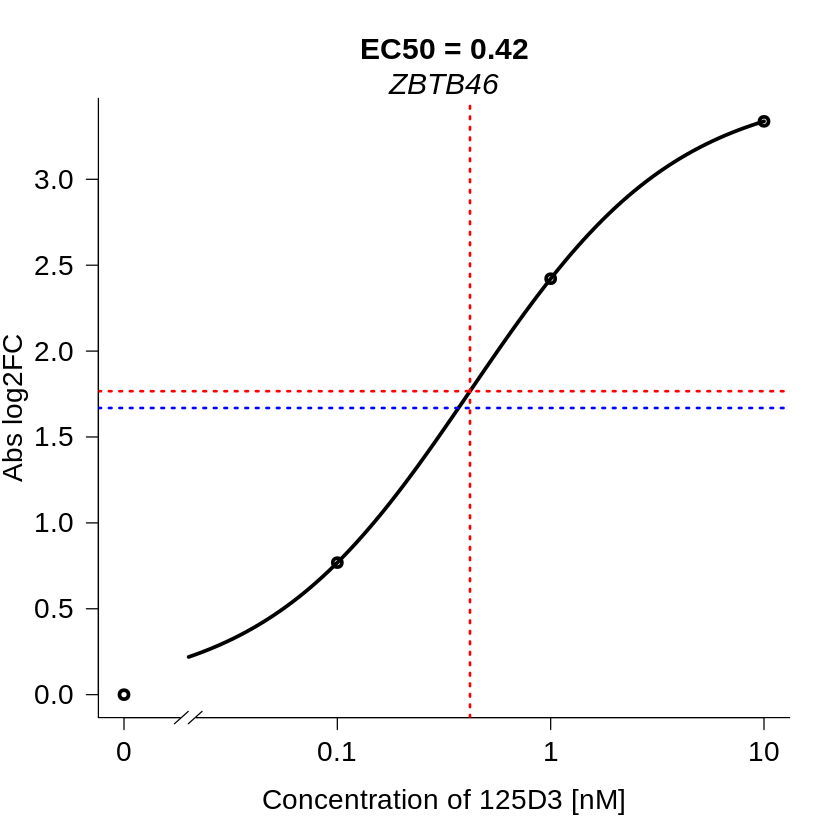

In [33]:
#plot_list = list()
for (i in seq_along(d$fit)){
   
#     pdf(paste("./Curves-cut-125D3/LL3_", d$name[[i]], "-125D-cut.pdf", sep = ""), 
#         width = 5, height = 4.34)

      plot(d$fit[[i]],
       bty="l",  
       broken=TRUE, 
       lwd=3,
     #      log = "",
     # sub = d$name[[i]] #,
       main = paste0("EC50 = ", round(d$fit[[i]]$coefficients['ec_50:(Intercept)'],2)),
       cex.main = 1.5,
      xlab = "Concentration of 125D3 [nM]",
      ylab = "Abs log2FC",
 #     ylim = c(0, 3),
      cex.lab = 1.4,    # X-axis and Y-axis labels size
     cex.axis = 1.4 # Axis labels size
      )
#     mtext ("Top text", adj = 1.7, paste0 ("", d$name[[i]]), cex = 1.3, font = 3)
      mtext(side = 3, paste0 ("", d$name[[i]]), cex = 1.5, font = 3)
      abline(v = d$fit[[i]]$coefficients['ec_50:(Intercept)'], col="red", lwd=2.1, lty=3)
      abline(h = 0.5*(d$fit[[i]]$coefficients['max_value:(Intercept)']), col="red", lwd=2.1, lty=3)
      abline(h = 0.5*(d$real_maxval[[i]]), col="blue", lwd=2.1, lty=3)   
#dev.off()    
    }

In [34]:
models <- map(split(mrg2,
                    mrg2$name),
                    gene_model_LL.3)

result <- map_df(models,
                 tidy,
                 .id = "name")

head (result)

Warning message in sqrt(diag(varMat)):
“NaNs produced”


name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,hill,(Intercept),-0.4268366,1.867817e-01,-2.285216e+00,2.625996e-01
ABCC3,max_value,(Intercept),5.1575946,6.993156e+00,7.375204e-01,5.954497e-01
ABCC3,ec_50,(Intercept),101.4302654,4.802824e+02,2.111888e-01,8.675000e-01
ACTB,hill,(Intercept),-0.4617349,1.902027e-05,-2.427593e+04,2.622432e-05
ACTB,max_value,(Intercept),1.8719115,7.237932e-05,2.586252e+04,2.461554e-05
ACTB,ec_50,(Intercept),1.5766860,3.045011e-04,5.177932e+03,1.229486e-04


In [35]:
res_ec50 = result %>%
filter (., term == "ec_50")

head (res_ec50)

res_pred_maxval = result %>%
filter (., term == "max_value")

#head (res_pred_maxval)

res_ec50 = res_ec50 %>%
  mutate (treatment = rep("V125D3",nrow(.)))

head(res_ec50)

name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),101.4302654,4.802824e+02,2.111888e-01,8.675000e-01
ACTB,ec_50,(Intercept),1.5766860,3.045011e-04,5.177932e+03,1.229486e-04
ACVRL1,ec_50,(Intercept),0.1400907,1.057460e-01,1.324785e+00,4.116326e-01
ADAMTSL4,ec_50,(Intercept),8.5478217,8.012129e-03,1.066860e+03,5.967226e-04
ADGRE1,ec_50,(Intercept),0.1604448,6.292500e-06,2.549778e+04,2.496765e-05
ADGRE3,ec_50,(Intercept),0.1462217,3.924363e-01,3.725999e-01,7.729402e-01


name,term,curve,estimate,std.error,statistic,p.value,treatment
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ABCC3,ec_50,(Intercept),101.4302654,4.802824e+02,2.111888e-01,8.675000e-01,V125D3
ACTB,ec_50,(Intercept),1.5766860,3.045011e-04,5.177932e+03,1.229486e-04,V125D3
ACVRL1,ec_50,(Intercept),0.1400907,1.057460e-01,1.324785e+00,4.116326e-01,V125D3
ADAMTSL4,ec_50,(Intercept),8.5478217,8.012129e-03,1.066860e+03,5.967226e-04,V125D3
ADGRE1,ec_50,(Intercept),0.1604448,6.292500e-06,2.549778e+04,2.496765e-05,V125D3
ADGRE3,ec_50,(Intercept),0.1462217,3.924363e-01,3.725999e-01,7.729402e-01,V125D3


In [36]:
library (metafor)

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack



Loading the 'metafor' package (version 3.0-2). For an
introduction to the package please type: help(metafor)




In [37]:
pooled_ED50 <- rma(estimate, std.error^2, data = res_ec50)
pooled_ED50

Warning message:
“Ratio of largest to smallest sampling variance extremely large. May not be able to obtain stable results.”



Random-Effects Model (k = 206; tau^2 estimator: REML)

tau^2 (estimated amount of total heterogeneity): 3.9848 (SE = 0.4243)
tau (square root of estimated tau^2 value):      1.9962
I^2 (total heterogeneity / total variability):   100.00%
H^2 (total variability / sampling variability):  25793721862648.97

Test for Heterogeneity:
Q(df = 205) = 11138059914421.6797, p-val < .0001

Model Results:

estimate      se    zval    pval   ci.lb   ci.ub 
  1.1089  0.1495  7.4184  <.0001  0.8159  1.4018  *** 

---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


In [38]:
res_model = full_join (res_ec50, res_pred_maxval, by = c("name" = "name"), suffix=c(".ec_50","pred_maxval")) 

head (res_model)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,treatment,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),101.4302654,4.802824e+02,2.111888e-01,8.675000e-01,V125D3,max_value,(Intercept),5.157595,6.993156e+00,7.375204e-01,5.954497e-01
ACTB,ec_50,(Intercept),1.5766860,3.045011e-04,5.177932e+03,1.229486e-04,V125D3,max_value,(Intercept),1.871911,7.237932e-05,2.586252e+04,2.461554e-05
ACVRL1,ec_50,(Intercept),0.1400907,1.057460e-01,1.324785e+00,4.116326e-01,V125D3,max_value,(Intercept),1.918566,8.312381e-02,2.308082e+01,2.756496e-02
ADAMTSL4,ec_50,(Intercept),8.5478217,8.012129e-03,1.066860e+03,5.967226e-04,V125D3,max_value,(Intercept),4.300385,1.241861e-03,3.462855e+03,1.838425e-04
ADGRE1,ec_50,(Intercept),0.1604448,6.292500e-06,2.549778e+04,2.496765e-05,V125D3,max_value,(Intercept),2.444826,5.501816e-06,4.443672e+05,1.432644e-06
ADGRE3,ec_50,(Intercept),0.1462217,3.924363e-01,3.725999e-01,7.729402e-01,V125D3,max_value,(Intercept),3.179791,3.639581e-01,8.736696e+00,7.255160e-02


In [39]:
d$fit[[1]]


A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
              -0.4268                 5.1576               101.4303  


In [40]:
real_FC = as.vector (d$real_maxval)
#real_halfFC = as.vector (0.5*(d$real_maxval)) 

In [41]:
head (res_model)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,treatment,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),101.4302654,4.802824e+02,2.111888e-01,8.675000e-01,V125D3,max_value,(Intercept),5.157595,6.993156e+00,7.375204e-01,5.954497e-01
ACTB,ec_50,(Intercept),1.5766860,3.045011e-04,5.177932e+03,1.229486e-04,V125D3,max_value,(Intercept),1.871911,7.237932e-05,2.586252e+04,2.461554e-05
ACVRL1,ec_50,(Intercept),0.1400907,1.057460e-01,1.324785e+00,4.116326e-01,V125D3,max_value,(Intercept),1.918566,8.312381e-02,2.308082e+01,2.756496e-02
ADAMTSL4,ec_50,(Intercept),8.5478217,8.012129e-03,1.066860e+03,5.967226e-04,V125D3,max_value,(Intercept),4.300385,1.241861e-03,3.462855e+03,1.838425e-04
ADGRE1,ec_50,(Intercept),0.1604448,6.292500e-06,2.549778e+04,2.496765e-05,V125D3,max_value,(Intercept),2.444826,5.501816e-06,4.443672e+05,1.432644e-06
ADGRE3,ec_50,(Intercept),0.1462217,3.924363e-01,3.725999e-01,7.729402e-01,V125D3,max_value,(Intercept),3.179791,3.639581e-01,8.736696e+00,7.255160e-02


In [42]:
res_model2 = res_model %>%
add_column (real_FC) %>%
mutate (., pred_halfFC = 0.5*estimatepred_maxval) %>%
mutate (., real_halfFC = 0.5*real_FC) %>%
mutate (., ratio_predvsreal = (pred_halfFC/real_halfFC)) %>%
mutate (., perc_dev = abs(ratio_predvsreal-1)*100)

head (res_model2)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,treatment,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval,real_FC,pred_halfFC,real_halfFC,ratio_predvsreal,perc_dev
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),101.4302654,4.802824e+02,2.111888e-01,8.675000e-01,V125D3,max_value,(Intercept),5.157595,6.993156e+00,7.375204e-01,5.954497e-01,1.433093,2.5787973,0.7165467,3.5989243,2.598924e+02
ACTB,ec_50,(Intercept),1.5766860,3.045011e-04,5.177932e+03,1.229486e-04,V125D3,max_value,(Intercept),1.871911,7.237932e-05,2.586252e+04,2.461554e-05,1.312556,0.9359557,0.6562780,1.4261574,4.261574e+01
ACVRL1,ec_50,(Intercept),0.1400907,1.057460e-01,1.324785e+00,4.116326e-01,V125D3,max_value,(Intercept),1.918566,8.312381e-02,2.308082e+01,2.756496e-02,2.001289,0.9592828,1.0006445,0.9586650,4.133501e+00
ADAMTSL4,ec_50,(Intercept),8.5478217,8.012129e-03,1.066860e+03,5.967226e-04,V125D3,max_value,(Intercept),4.300385,1.241861e-03,3.462855e+03,1.838425e-04,2.255927,2.1501923,1.1279637,1.9062603,9.062603e+01
ADGRE1,ec_50,(Intercept),0.1604448,6.292500e-06,2.549778e+04,2.496765e-05,V125D3,max_value,(Intercept),2.444826,5.501816e-06,4.443672e+05,1.432644e-06,2.444798,1.2224132,1.2223988,1.0000118,1.180246e-03
ADGRE3,ec_50,(Intercept),0.1462217,3.924363e-01,3.725999e-01,7.729402e-01,V125D3,max_value,(Intercept),3.179791,3.639581e-01,8.736696e+00,7.255160e-02,3.543620,1.5898956,1.7718102,0.8973284,1.026716e+01


In [43]:
write.xlsx (res_model2, "./data/ec50table_125D3_LL3.xlsx")

In [44]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Rocky Linux 8.5 (Green Obsidian)

Matrix products: default
BLAS/LAPACK: /research/users/andreha/miniconda3/envs/Mamba-14/lib/libopenblasp-r0.3.18.so

locale:
 [1] LC_CTYPE=C.UTF-8           LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] metafor_3.0-2   Matrix_1.4-0    modelr_0.1.8    broom_0.7.11   
 [5] drc_3.0-1       MASS_7.3-54     ggpubr_0.4.0    reshape2_1.4.4 
 [9] cowplot_1.1.1   ggrepel_0.9.1   magrittr_2.0.1  openxlsx_4.2.5 
[13] forcats_0.5.1   stringr_1.4.0   dplyr_1.0.7     purrr_0.3.4    
[